# BNB: Distance to a Sketched Region and Gene Expression Gradient Along it
Data is obtained from 10X Genomics

In [5]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [6]:
from spatialdata_io import xenium
import spatialdata as sd
import scanpy as sc
import pandas as pd
import squidpy as sq
import os
import geopandas as gpd
from shapely.geometry import Point
import celldega as dega
from celldega.pre.boundary_tile import batch_transform_geometries

import warnings
warnings.filterwarnings("ignore")

/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/Users/whuan/miniconda3/envs/celldega_env/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


## Initialize data directory

In [7]:
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'data/raw'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'data/landscape_files/{dataset_name}'

## Ingest raw data with spatialdata-io and write adata with spatialdata

In [ ]:
# Ingest xenium data raw output folder using spatialdata-io
sdata = xenium(data_dir)

# Write sdata to a zarr file
zarr_path = f"{data_dir}.zarr"

# Check if the zarr file already exists
if os.path.exists(zarr_path):
    print(f"The file {zarr_path} already exists.")
else:
    # If the file does not exist, write the data
    sdata.write(zarr_path)
    print(f"Data written to {zarr_path} successfully.")

# Read zarr file using spatialdata
sdata = sd.read_zarr(zarr_path)

# Create anndata from sdata.tables['table]
adata = sdata.tables["table"]

INFO     reading data/raw/Xenium_V1_human_Pancreas_FFPE_outs/cell_feature_matrix.h5                                
The file data/raw/Xenium_V1_human_Pancreas_FFPE_outs.zarr already exists.


## Preprocessing with scanpy

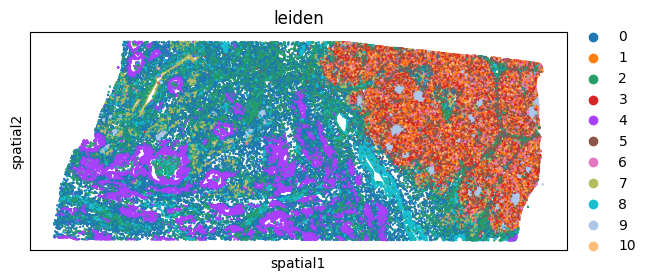

In [5]:
# Filter cells and genes
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

# Derived data
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=[
        "leiden",
    ],
    wspace=0.4,
)

# Write h5ad files
adata.write_h5ad(f'{data_dir}.h5ad')

## Load adata and selected ROI (manually sketched in Celldega Landscape view)

In [179]:
# Load h5ad file
adata = sc.read_h5ad(f'{data_dir}.h5ad')
adata.obs.set_index('cell_id', inplace=True)


# Load Geo parquet
gdf_polygons = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')

# Specify the polygon
roi_name = 'region_1'
gdf_polygon = gdf_polygons.loc[gdf_polygons["roi"] == roi_name].reset_index()

# Calculate the distance from all cells to it

Extracting polygon for ROI: region_1
Distance column 'distance_to_roi_region_1' added to adata.obs.
Plotting distances from points to polygon region_1...


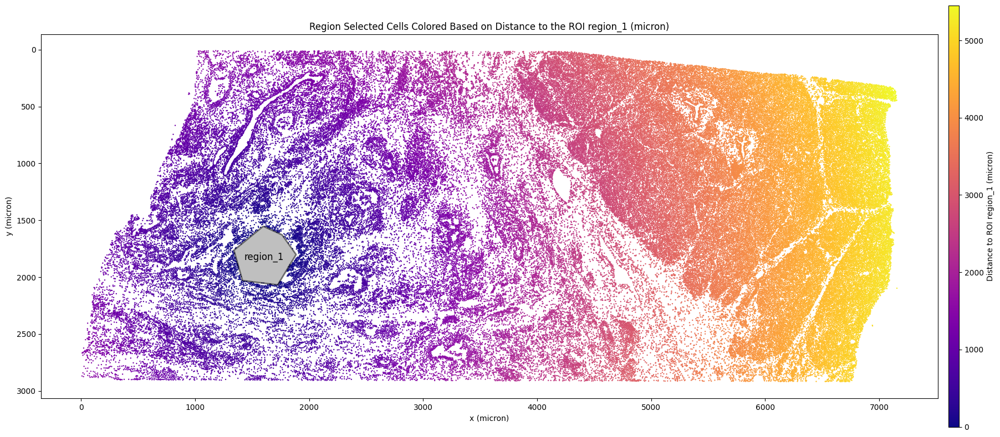

In [180]:
# Calculate distances
adata = dega.sp.calc_distance_to_roi(
    adata, 
    gdf_polygon
)

# Plot distances
dega.viz.plot_distance_to_roi(
    adata, 
    gdf_polygon, 
    roi_name,
    markersize=0.5
)



## Plot gene expression gradient along the distance to selected ROI

In [ ]:

# Create a simple reference GeoDataFrame bound the concentric rings
gdf_ref = gpd.GeoDataFrame(
    data={'cluster': adata.obs['leiden'],},
    geometry=[Point(xy) for xy in adata.obsm['spatial'][:, :2]],
    crs="EPSG:4326"
)

# Generate concentric bands
band_width = 200
gdf_bands = dega.nbhd.calc_grad_nbhd_from_roi(gdf_polygon, gdf_ref, band_width)

# Calculate mean gene expression by band
gdf_join_all = dega.sp.calc_gene_expression_by_band(
    adata,
    gdf_bands,
    nbhd_col ='band'
)

# Save bands to Parquet
gradient_region_parquet_file_micron = f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi_name}_micron.parquet"
gdf_bands.to_parquet(gradient_region_parquet_file_micron, engine="pyarrow")



Plotting gene expression gradient from points to ROI region_1...


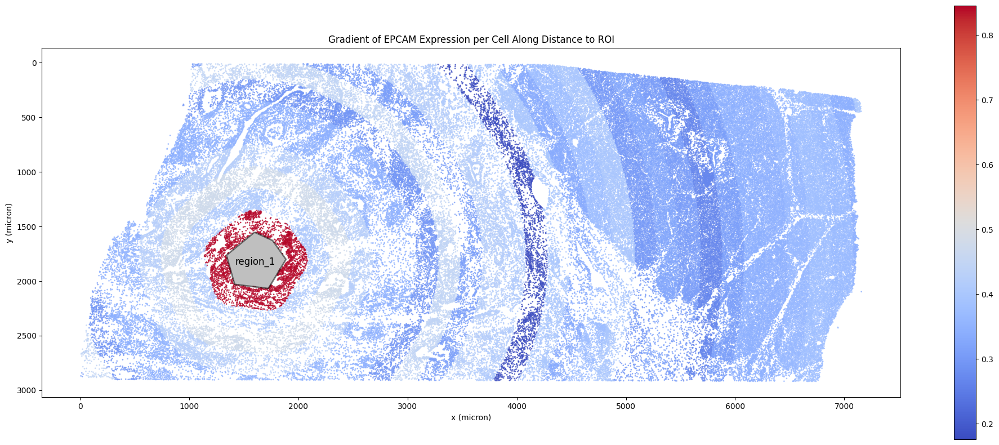

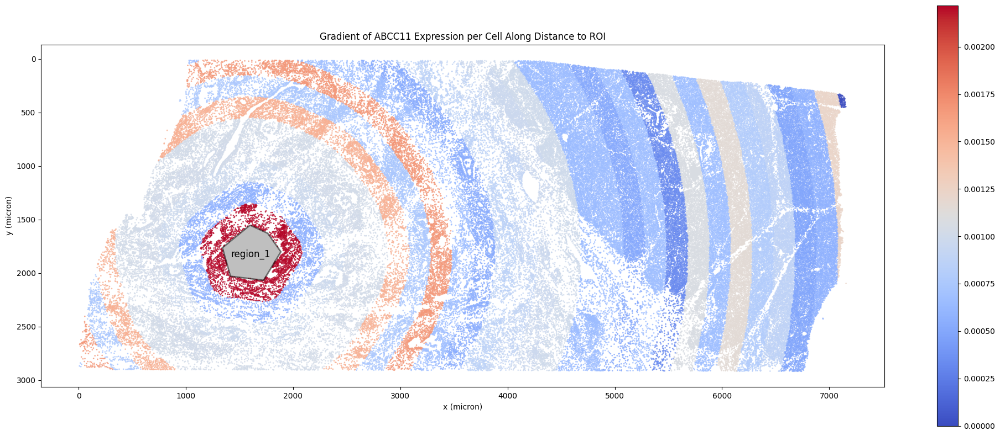

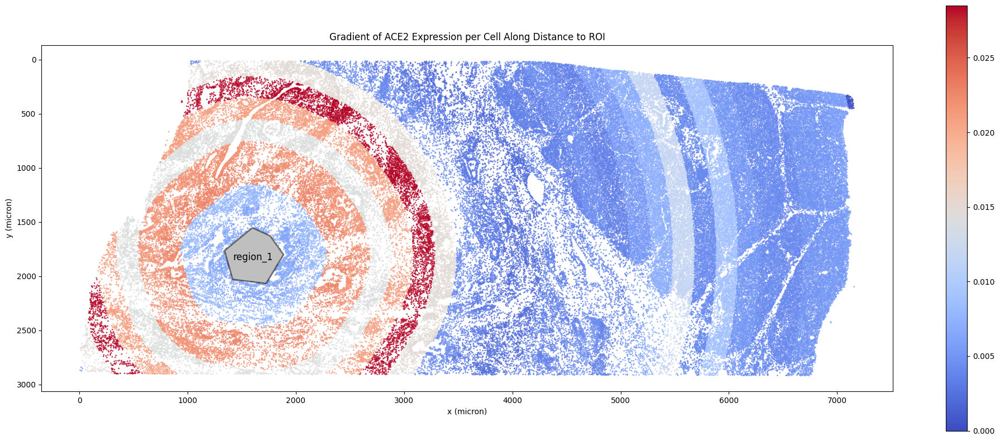

In [183]:
# Plot gene gradients
dega.viz.plot_gene_gradient_to_roi(
    gdf_join_all,
    gdf_polygon,
    roi_name,
    gene_list=['EPCAM','ABCC11', 'ACE2'],
    markersize=1
)
